In [1]:
!gdown --id 1fvgnBT9VpRo0mE7j9zPMCp7CI3St5zXP

Downloading...
From: https://drive.google.com/uc?id=1fvgnBT9VpRo0mE7j9zPMCp7CI3St5zXP
To: /content/snow.zip
483MB [00:12, 39.0MB/s]


In [2]:
!unzip snow.zip

Archive:  snow.zip
  inflating: snow.csv                
  inflating: snow_features.csv       


In [3]:
!pip install catboost plotly

     |████████████████████████████████| 66.2MB 56kB/s 


[Данные](https://yadi.sk/d/CBoVCVIxJ2q2cw)

# Обработка лидарных данных
## Сегментация

### Про лидар

## А что за данные на самом деле


In [20]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

import plotly
import plotly.offline as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
import tqdm
py.init_notebook_mode(connected=True)
plotly.io.renderers.default = 'colab'

EQUAL_ASPECT_RATIO_LAYOUT = dict(
    margin={
        'l': 0,
        'r': 0,
        'b': 0,
        't': 0
    }, scene=dict(
    aspectmode='data'
))


def color(x, cmap='Reds'):
    cmap = plt.get_cmap(cmap)
    x = (x - np.min(x)) / np.max(x)
    
    return cmap(x)

%matplotlib inline

In [21]:
ds = pd.read_csv('./snow.csv')
ds = ds.set_index(['scene_id'])
ds.head()

,x,y,z,intensity,ring,label
scene_id,,,,,,
0,-11.355618,-4.206962,0.344085,0.0,23.0,1.0
0,-5.916535,-1.972164,0.283262,0.0,25.0,1.0
0,-7.410451,-2.113039,2.137792,0.0,31.0,1.0
0,-13.845870,-1.406652,0.406310,0.0,23.0,1.0
0,-8.326218,-0.346060,0.226469,0.0,22.0,1.0


* intensity - ???
* ring - ???

### Кольцо

![](https://eckop.com/wp-content/uploads/2018/07/LIDAR_02-1024x366.png)

In [22]:
scene = ds.loc[0]

fig = go.Figure(layout=EQUAL_ASPECT_RATIO_LAYOUT)
fig.add_scatter3d(**{
    'x': scene.x,
    'y': scene.y,
    'z': scene.z,
    'mode': 'markers',
    'marker': {
        'size': 1,
        'color': color(scene.ring, 'tab20'),
    },
    'text': scene.ring
})

py.iplot(fig)


### Интенсивность

![](https://res.mdpi.com/sensors/sensors-15-28099/article_deploy/html/images/sensors-15-28099-g001-1024.png)

In [23]:
fig = go.Figure(layout=EQUAL_ASPECT_RATIO_LAYOUT)
fig.add_scatter3d(**{
    'x': scene.x,
    'y': scene.y,
    'z': scene.z,
    'mode': 'markers',
    'marker': {
        'size': 1,
        'color': color(scene.intensity, 'seismic'),
    },
    'text': scene.intensity
})

py.iplot(fig)

In [24]:
scene = ds.loc[1]

fig = go.Figure(layout=EQUAL_ASPECT_RATIO_LAYOUT)
fig.add_scatter3d(**{
    'x': scene.x,
    'y': scene.y,
    'z': scene.z,
    'mode': 'markers',
    'marker': {
        'size': 1,
        'color': color(scene.intensity, 'seismic'),
    },
    'text': scene.ring
})

py.iplot(fig)


# Отфильтруем снег

## Эвристикой

In [25]:
def filter_by_intensity(intensity, limit=3):
    return intensity > limit

In [26]:
filtered_scene = scene[filter_by_intensity(scene.intensity)]


fig = go.Figure(layout=EQUAL_ASPECT_RATIO_LAYOUT)
fig.add_scatter3d(**{
    'x': filtered_scene.x,
    'y': filtered_scene.y,
    'z': filtered_scene.z,
    'mode': 'markers',
    'marker': {
        'size': 1,
        'color': color(filtered_scene.intensity, 'seismic'),
    },
    'text': scene.ring
})

py.iplot(fig)

Плохо и непонятно, будем учить

## Облачные вычисления

In [27]:
from sklearn.neighbors import KDTree

class ComputeFeatures(object):
    def __init__(self, r=1.0):
        self.xyz = None
        self.intensity = None
        self.ring = None
        self.index = None
        self.r = r

    def _feature_names(self):
        return ("x", "y", "z", "intensity", "ring", "num_neighbours") + \
        tuple(f"NBHD_{stat}_{name}" 
              for name in ("distances", "intensities", "rel_intensities", "rings", "rel_rings") 
              for stat in ("min", "max", "median", "mean", "std")) 

    def compute_point_features(self, point_id, neighbours, distances):
        intensities = self.intensity[neighbours]
        rings = self.ring[neighbours]
        rel_intensities = intensities - self.intensity[point_id]
        rel_rings = rings - self.ring[point_id]
        return (*self.xyz[point_id], 
                self.intensity[point_id], 
                self.ring[point_id], 
                len(neighbours)) + \
                tuple(
                    chain.from_iterable(self.get_statistics(x) 
                    for x in (distances, intensities, rel_intensities, rings, rel_rings))
               ) if len(neighbours) > 0 else (0,) * 5 * 5
            
    def get_statistics(self, arr):
        return np.min(arr), np.max(arr), np.median(arr), np.mean(arr), np.std(arr)
    
    def get_point_neighbours(self, point_id):
        neighbours = self.index.query_radius(self.xyz[point_id][np.newaxis, :], r=self.r, return_distance=True)
        neighbours_ids, neighbours_dists = neighbours[0][0], neighbours[1][0]
        return neighbours_ids, neighbours_dists
        
    def __call__(self, xyz, intensity, ring):
        self.xyz = xyz[:]
        self.intensity = intensity[:]
        self.ring = ring[:]
        
        self.index = KDTree(self.xyz)
        
        features = []
        for point_id in range(len(self.xyz)):
            neighbours, dists = self.get_point_neighbours(point_id)
            features.append(self.compute_point_features(point_id, neighbours, dists))
        return pd.DataFrame(columns=self._feature_names(), data=features)

In [28]:
!rm -rf features
!mkdir features

In [29]:
from multiprocessing import Pool
from functools import partial
from itertools import chain

In [30]:
def process_scene(scene_id, ds=None, features=None):
    assert ds is not None and features is not None
    scene = ds.loc[scene_id]
    features_df = features(scene[['x', 'y', 'z']].values, scene.intensity.values, scene.ring.values)
    features_df["scene_id"] = scene_id
    features_df["label"] = scene.label.values
    features_df.to_csv('./features/{}.csv'.format(scene_id))

features = ComputeFeatures(r=1.0)
_process_scene = partial(process_scene, ds=ds, features=features)

In [31]:
pool = Pool(4)
scene_ids = ds.reset_index().scene_id.unique()

In [32]:
with tqdm.tqdm(total=len(scene_ids), position=0, leave=True) as pbar:
    for i, _ in enumerate(pool.imap_unordered(_process_scene, scene_ids)):
        pbar.update()

100%|██████████| 291/291 [1:18:01<00:00, 16.09s/it]


# Посмотрим на разметку

In [33]:
scene = ds.loc[1]

fig = go.Figure(layout=EQUAL_ASPECT_RATIO_LAYOUT)
fig.add_scatter3d(**{
    'x': scene.x,
    'y': scene.y,
    'z': scene.z,
    'mode': 'markers',
    'marker': {
        'size': 1,
        'color': color(scene.label, 'seismic'),
    },
    'text': scene.label
})

py.iplot(fig)

## Поучим что-нибудь

In [34]:
from sklearn.model_selection import train_test_split
train_ids, test_ids = train_test_split(np.arange(len(scene_ids)), train_size=0.8)
test_ids, val_ids = train_test_split(test_ids, train_size=0.5)

In [35]:
def get_from_csv(ids, ds):
    features = pd.concat([pd.read_csv(f"./features/{scene_id}.csv") for scene_id in tqdm.tqdm(ids)])
    features.drop(["Unnamed: 0"], axis=1)
    return features

In [36]:
train = get_from_csv(train_ids, ds)
test = get_from_csv(test_ids, ds)
val = get_from_csv(val_ids, ds)

100%|██████████| 30/30 [00:03<00:00,  8.02it/s]


In [38]:
train.to_csv("snow_train.csv")
test.to_csv("snow_test.csv")
val.to_csv("snow_val.csv")

In [39]:
import catboost

def learn(X_train, X_val, y_train, y_val):
    clf = catboost.CatBoostClassifier(n_estimators=100)
    clf.fit(
        X_train, y_train, early_stopping_rounds=10,
        use_best_model=True, eval_set=(X_val.values, y_val.values), plot=True, verbose=False)
    return clf

X_train = train.drop(["scene_id", "label", "x", "y", "z"], axis=1)
y_train = train.label


X_val = val.drop(["scene_id", "label", "x", "y", "z"], axis=1)
y_val = val.label

In [40]:
del ds
cls = learn(X_train, X_val, y_train, y_val)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [41]:
X_test = test.drop(['scene_id', 'x', 'y', 'z', 'label'], axis=1)
y_test = test.label

from sklearn.metrics import precision_recall_curve, precision_score, recall_score

def test_one(clf, X_test, y_test):
    y_test_hat = clf.predict_proba(X_test)
    pr, rec, thr = precision_recall_curve(y_test, y_test_hat[:, 1])
    ix = np.linspace(1, len(pr)-1, num=2000).astype(int)
    return pr[ix], rec[ix], thr[ix - 1]


def heuristic_filter_scoring():
    pr = []
    rec = []
    filter_range = list(range(1, 10))
    for i in filter_range:
        y_test_heuristic_hat = np.ones(len(X_test))
        y_test_heuristic_hat[filter_by_intensity(test.intensity, i)] = 0
        pr.append(precision_score(y_test, y_test_heuristic_hat))
        rec.append(recall_score(y_test, y_test_heuristic_hat))
        
    return pr, rec, filter_range

pr_bl, rec_bl, thr_bl = heuristic_filter_scoring()

def plot_pr_rec(*models):
    traces = []
    for model, clf, X_test, y_test in models:
        pr, rec, thr = test_one(clf, X_test, y_test)
        pr_rec = go.Scattergl(x = rec, y = pr, mode='lines', text=thr, name=model)
        traces.append(pr_rec)

    pr_rec_bl = go.Scatter(x = rec_bl, y = pr_bl, mode='lines+markers', text=thr_bl, name='Intensity BL')

    layout = go.Layout(
        title='Precission-recall',
        xaxis=dict(
            title='Recall'
        ),
        yaxis=dict(
            title='Precission'
        ))
    fig = go.Figure(
        data=traces + [pr_rec_bl],
        layout=layout)
    py.iplot(fig)
    
models = [('Catboost classifier', cls, X_test, y_test)]
plot_pr_rec(*models)

Площаль под precision-recall почти идеальная - близка к 1. Это говорит об очень качественной классификации с помощью выбранных фичей и алгоритма. Очевидно, что **catboost** с продуманными фичами сильно выигрывает у бейзлайна по всем показателям. 

# Повизуализируем

In [42]:
y_test_hat = cls.predict_proba(test.drop(['scene_id', 'x', 'y', 'z', 'label'], axis=1))

In [43]:
itest = test.set_index(['scene_id'])

In [44]:
scene_id = 212
scene = itest.loc[scene_id]
scene_predictions = y_test_hat[test.scene_id == scene_id][:, 1]

In [49]:
fig = go.Figure(layout=EQUAL_ASPECT_RATIO_LAYOUT)
fig.add_scatter3d(**{
    'x': scene.x,
    'y': scene.y,
    'z': scene.z,
    'mode': 'markers',
    'marker': {
        'size': 2,
        'color': color(scene_predictions, 'seismic'),
    },
    'text': scene.label
})
py.iplot(fig)

In [48]:
fig = go.Figure(layout=EQUAL_ASPECT_RATIO_LAYOUT)
fig.add_scatter3d(**{
    'x': scene.x,
    'y': scene.y,
    'z': scene.z,
    'mode': 'markers',
    'marker': {
        'size': 2,
        'color': color(scene_predictions - scene.label, 'seismic'),
    },
    'text': scene.label
})
py.iplot(fig)

На примере видно, что основные точки проклассифицированны провильно, а ошибки незначительные, такое предсказание не приведет к каким-то неожиданным результатам, можно использовать :)

In [56]:
from sklearn.metrics import classification_report
print(classification_report(scene.label, np.round(scene_predictions)))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     24324
         1.0       0.99      1.00      1.00      1607

    accuracy                           1.00     25931
   macro avg       1.00      1.00      1.00     25931
weighted avg       1.00      1.00      1.00     25931



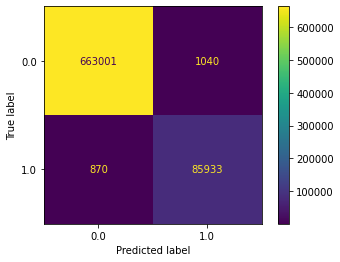

In [60]:
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
plot_confusion_matrix(cls, X_test, y_test, values_format='d')

Видно, что снег классифицируется практически всегда верно и FN не такой уж большой. Это было еще понятно по графику precision-recall, матрица ошибок лишь подтвердила рассуждения.